In [231]:
from pycocotools.coco import COCO
from PIL import Image
import os
import json

coco_annotation_file = '/mnt/ddisk/boux/code/data/simd/val_coco.json'
new_annotations_file = '/mnt/ddisk/boux/code/data/simd/val_coco_crops.json'
images_dir = '/mnt/ddisk/boux/code/data/simd/validation'
output_dir = '/mnt/ddisk/boux/code/data/simd/validation_crops'
original_image_width = 1024
original_image_height = 1024

# Load the original COCO format annotations
coco = COCO(coco_annotation_file)

# Create a directory to save cropped images
os.makedirs(output_dir, exist_ok=True)

# Define the desired crop size (width/4, height/4)
crop_width = original_image_width // 2  # Replace original_image_width with the actual width of your images
crop_height = original_image_height // 2  # Replace original_image_height with the actual height of your images

# Initialize a new COCO format annotation dictionary
new_coco_format = {
    "info": coco.dataset.get("info", {}),
    "licenses": coco.dataset.get("licenses", []),
    "categories": coco.dataset["categories"],
    "images": [],
    "annotations": []
}

# Process each image in the dataset
for img_id in coco.getImgIds():
    img_info = coco.loadImgs(img_id)[0]
    image = Image.open(os.path.join(images_dir, img_info['file_name']))  # Load the image

    # Crop the image into smaller crops
    for i in range(0, image.size[1], crop_height):
        for j in range(0, image.size[0], crop_width):
            cropped_img = image.crop((j, i, j + crop_width, i + crop_height))

            # Save the cropped image
            cropped_img.save(os.path.join(output_dir, f"{img_info['file_name'][:-4]}_{i}_{j}.jpg"))

            # Adjust annotations for the cropped image
            annotations = coco.loadAnns(coco.getAnnIds(imgIds=img_id))
            for ann in annotations:
                ann_x, ann_y, ann_width, ann_height = ann['bbox']
                if ann_x >= j and ann_x + ann_width <= j + crop_width and ann_y >= i and ann_y + ann_height <= i + crop_height:
                    ann['bbox'] = [ann_x - j, ann_y - i, ann_width, ann_height]  # Adjust bbox coordinates
                    ann['image_id'] = len(new_coco_format['images']) + 1  # Update image ID for annotations
                    new_coco_format['annotations'].append(ann)

            # Add information about the cropped image to the new COCO format
            new_img_info = img_info.copy()
            new_img_info['id'] = len(new_coco_format['images']) + 1
            new_img_info['width'] = crop_width
            new_img_info['height'] = crop_height
            new_img_info['file_name'] = f"{img_info['file_name'][:-4]}_{i}_{j}.jpg"
            new_coco_format['images'].append(new_img_info)

# Save the adjusted annotations to a new COCO format JSON file
with open(new_annotations_file, 'w') as outfile:
    json.dump(new_coco_format, outfile)



loading annotations into memory...
Done (t=0.03s)
creating index...
index created!


loading annotations into memory...
Done (t=0.03s)
creating index...
index created!


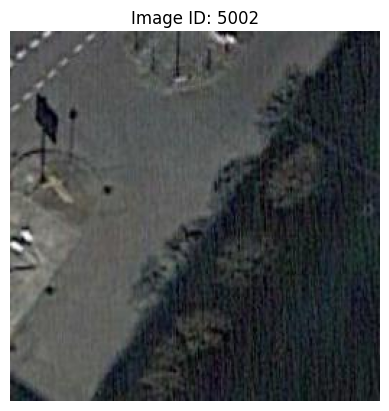

In [230]:
from pycocotools.coco import COCO
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def plot_random_image_with_annotations(coco_annotation_file, images_directory):
    # Load COCO annotations
    coco = COCO(coco_annotation_file)

    # Get a list of image IDs
    image_ids = coco.getImgIds()

    # Choose a random image ID
    random_image_id = random.choice(image_ids)

    # Load information about the random image
    img_info = coco.loadImgs(random_image_id)[0]
    file_name = img_info['file_name']

    # Load the image using PIL
    image_path = os.path.join(images_directory, file_name)
    image = Image.open(image_path)

    # Get annotations for the random image
    ann_ids = coco.getAnnIds(imgIds=img_info['id'])
    annotations = coco.loadAnns(ann_ids)

    # Plot the image with bounding box annotations
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for ann in annotations:
        bbox = ann['bbox']
        bbox = [bbox[0], bbox[1], bbox[2], bbox[3]]  # [x, y, width, height]
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.title(f"Image ID: {random_image_id}")
    plt.axis('off')
    plt.show()


new_annotations_file = '/mnt/ddisk/boux/code/data/simd/val_coco_crops.json'
images_dir = '/mnt/ddisk/boux/code/data/simd/validation'
output_dir = '/mnt/ddisk/boux/code/data/simd/validation_crops'

plot_random_image_with_annotations(new_annotations_file, output_dir)
#print(new_annotations_file)

In [212]:
coco_json_path = '/mnt/ddisk/boux/code/data/simd/train_coco.json'
new_annotations_file = '/mnt/ddisk/boux/code/data/simd/train_coco_CROPS.json'
images_dir = '/mnt/ddisk/boux/code/data/simd/training'
output_dir = '/mnt/ddisk/boux/code/data/simd/training_CROPS'

In [1]:
from transformers import CLIPModel

# Imports
import torch
#from torch.utils.data import DataLoader
from datasets.dataset import DINODataset
from models.detector import OVDDetector

/mnt/ddisk/boux/miniconda3/envs/dino_detector/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
root_dir = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/val/images'
annotations_file = '/mnt/ddisk/boux/code/data/simd/train_coco_subset.json'
prototypes_path = '/mnt/ddisk/boux/code/ovdsat/prototypes/simd_prototypes.pth'
bg_prototypes_path = '/mnt/ddisk/boux/code/ovdsat/prototypes/simd_bg_prototypes.pth'
target_size = (602, 602)
batch_size = 1 
num_workers = 8 
iou_thr = 0.3
conf_thres = 1
scale_factor = [2]
backbone_type = 'clip-14'

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_image_with_boxes(image, preds):
    
    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(image.permute(1,2,0)/255)

    # Get bounding boxes, classes, and scores from the data dictionary
    preds = preds.cpu().numpy()

    # Create a Rectangle patch for each bounding box and add it to the plot
    for box in zip(preds):
        x1, y1, x2, y2, conf, cls = box[0]
        print(cls, conf)
        width = x2 - x1
        height = y2 - y1
        rect = patches.Rectangle((x1, y1), width, height, linewidth=1, edgecolor='r' if cls <3 else 'b', facecolor='none')
        ax.add_patch(rect)
        #ax.text(x1, y1, f'Class {int(class_pred)}', color='r', fontsize=8, weight='bold')

    # Show plot
    plt.axis('off')  # Disable axis
    plt.show()


In [10]:
# Use GPU if available
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
model = OVDDetector
prototypes = torch.load(prototypes_path)
bg_prototypes = torch.load(bg_prototypes_path)
model = OVDDetector(prototypes, bg_prototypes, backbone_type=backbone_type, scale_factor=scale_factor, target_size=target_size).to(device)

def detect(path, model, iou_thr=0.2, conf_thres=0.2):
    image, metadata = dataset.get_by_path(path)
    
    with torch.no_grad():
        preds = model(image.float().to(device).unsqueeze(0), iou_thr=iou_thr, conf_thres=conf_thres, box_conf_threshold=0)
    return preds[0], image

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [11]:
dataset = DINODataset(root_dir, annotations_file, torch.load(prototypes_path)['label_names'], augment=False, target_size=target_size, real_indices=False)

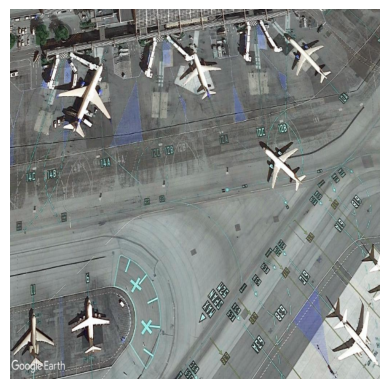

In [12]:
path = '/mnt/ddisk/boux/code/data/simd/val/train/images/0122.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

In [14]:
image.shape

torch.Size([3, 602, 602])

In [1]:
# Imports
import torch
from torch.utils.data import DataLoader
from datasets.dataset import DINODataset
from models.detector import OVDDetector

/mnt/ddisk/boux/miniconda3/envs/dino_detector/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
torch.load(prototypes_path)['label_names']

['trainer-aircraft',
 'pushback-truck',
 'propeller-aircraft',
 'truck',
 'car',
 'charted-aircraft',
 'figther-aircraft',
 'helicopter',
 'van',
 'airliner',
 'stair-truck',
 'bus',
 'boat',
 'others',
 'long-vehicle']

In [21]:
root_dir = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/val/images'
annotations_file = '/mnt/ddisk/boux/code/data/simd/train_coco_subset.json'
prototypes_path = '/mnt/ddisk/boux/code/ovdsat/prototypes/simd_prototypes.pth'
bg_prototypes_path = '/mnt/ddisk/boux/code/ovdsat/prototypes/simd_bg_prototypes.pth'
target_size = (602, 602)
batch_size = 1 
num_workers = 8 
iou_thr = 0.3
conf_thres = 1
scale_factor = [1]

In [22]:
dataset = DINODataset(root_dir, annotations_file, torch.load(prototypes_path)['label_names'], augment=False, target_size=target_size, real_indices=False)
dataloader = test_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

In [23]:
# Use GPU if available
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
model = OVDDetector
prototypes = torch.load(prototypes_path)
bg_prototypes = torch.load(bg_prototypes_path)
model = OVDDetector(prototypes, bg_prototypes, scale_factor=scale_factor, target_size=target_size).to(device)

Using cache found in /home/boux/.cache/torch/hub/facebookresearch_dinov2_main


In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_image_with_boxes(image, preds):
    
    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(image.permute(1,2,0)/255)

    # Get bounding boxes, classes, and scores from the data dictionary
    preds = preds.cpu().numpy()

    # Create a Rectangle patch for each bounding box and add it to the plot
    for box in zip(preds):
        x1, y1, x2, y2, conf, cls = box[0]
        print(cls, conf)
        width = x2 - x1
        height = y2 - y1
        rect = patches.Rectangle((x1, y1), width, height, linewidth=1, edgecolor='r' if cls <3 else 'b', facecolor='none')
        ax.add_patch(rect)
        #ax.text(x1, y1, f'Class {int(class_pred)}', color='r', fontsize=8, weight='bold')

    # Show plot
    plt.axis('off')  # Disable axis
    plt.show()

def detect(path, model, iou_thr=0.2, conf_thres=0.3):
    image, metadata = dataset.get_by_path(path)
    
    with torch.no_grad():
        preds = model(image.float().to(device).unsqueeze(0), iou_thr=iou_thr, conf_thres=conf_thres, box_conf_threshold=0)
    return preds[0], image

/mnt/ddisk/boux/miniconda3/envs/dino_detector/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


4.0 5.6260443
4.0 5.549846
4.0 5.5426116
4.0 5.4235125
4.0 5.4041862
4.0 5.353668
4.0 5.346156
4.0 5.19328
4.0 5.180196
4.0 5.1532063
4.0 5.1413713
4.0 5.137815
4.0 5.1158376
4.0 5.0872364
4.0 5.0863867
4.0 5.06081
4.0 4.991166
4.0 4.9368033
4.0 4.9251432
4.0 4.854351
4.0 4.796269
4.0 4.7319984
4.0 4.698389
4.0 4.6510196
4.0 4.6151214
4.0 4.605772
4.0 4.5994873
4.0 4.546251
4.0 4.4401984
4.0 4.429297
3.0 4.3828926
4.0 4.378097
4.0 4.32759
4.0 4.3094387
4.0 4.2914743
4.0 4.28665
4.0 4.2165694
8.0 4.1671
4.0 4.158112
8.0 4.1542706
4.0 4.1418376
8.0 4.067546
4.0 4.0611234
4.0 4.0530624
4.0 4.0320816
3.0 4.0134454
4.0 3.9812725
4.0 3.9125812
4.0 3.9041643
4.0 3.7652414
8.0 3.7637823
4.0 3.649714
4.0 3.605164
4.0 3.5779738
4.0 3.5151794
3.0 3.376593
8.0 3.371832
4.0 3.3304088
8.0 3.2478104
4.0 3.1962836
4.0 2.9693637
4.0 2.8883698
8.0 2.8810387
4.0 2.4151256
8.0 2.1946964
3.0 2.1072743
8.0 2.0248961
8.0 2.0234172
4.0 1.8517532
8.0 1.5228014
8.0 1.1477581
4.0 1.090893
8.0 0.8819809
4.0 0.846

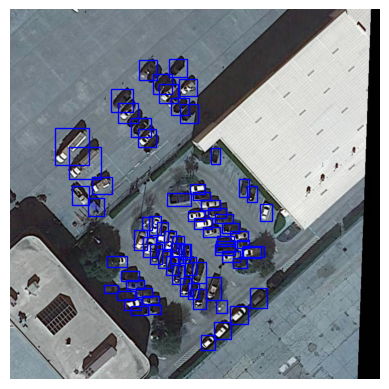

In [11]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/ovd_experiment/val/images/P1512__1.0__916___600.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

1.0 1.8548428
1.0 0.63212687


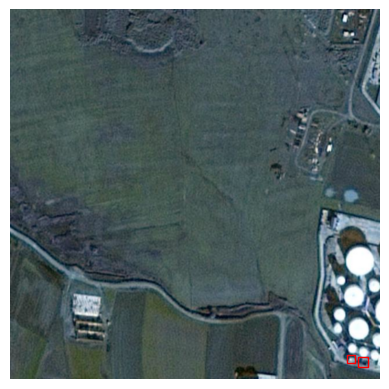

In [12]:
path = '/mnt/ddisk/boux/code/devit/demo/input/5ffdf3ae-89d3-47b1-be54-3475bf1edcdc_576_1216.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

2.0 5.0191717
2.0 4.254672
2.0 4.16904
2.0 3.8740134
2.0 2.9399178
2.0 2.8723607
2.0 0.7089111
12.0 0.2253711
2.0 0.07047445


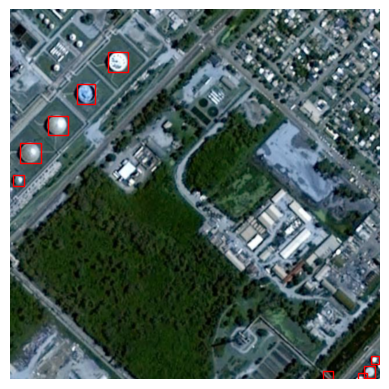

In [42]:
path = '/mnt/ddisk/boux/code/devit/demo/input/a3dd1907-3112-4f7c-8824-bdf7b0d9e016_1216_1216.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

2.0 4.686786
2.0 4.601326
2.0 4.362116
2.0 4.1832848
2.0 4.118893
2.0 3.508247
2.0 3.2902563
2.0 2.950683
2.0 2.4157217
11.0 1.4523621


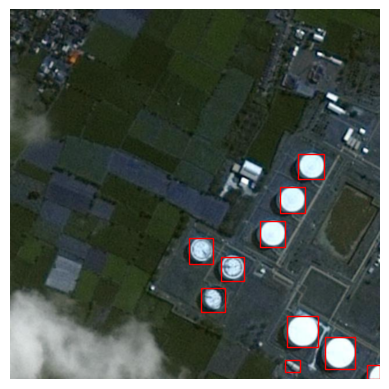

In [43]:
path = '/mnt/ddisk/boux/code/devit/demo/input/dd28a203-3aee-4364-8347-1c725abe2efc_576_1920.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

2.0 2.9040384
2.0 2.807556
2.0 2.7597432
2.0 2.677169
2.0 2.6222305
2.0 2.5738113
2.0 2.4608316
2.0 2.3695714
2.0 2.327455
2.0 2.291233
2.0 2.1724713
2.0 2.0303926
2.0 2.0301573
2.0 1.1547896
2.0 0.5867944


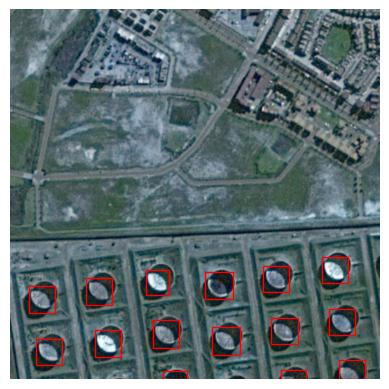

In [44]:
path = '/mnt/ddisk/boux/code/devit/demo/input/4fc1410d-4d29-4e08-a644-5fb84ef1cd3e_1920_1216.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

2.0 4.8838806
2.0 4.6368356
2.0 4.5690465
2.0 4.5596843
2.0 4.530453
2.0 4.502514
2.0 4.48379
2.0 4.438259
2.0 4.4200206
2.0 4.418716
2.0 4.394459
2.0 4.1701837
2.0 4.157006
2.0 4.075644
2.0 4.066026
2.0 3.9837704
2.0 3.977134
2.0 3.8398378
2.0 3.773062
2.0 3.6719387
2.0 3.6710718
2.0 3.4635139
2.0 3.2373893
2.0 3.0009918
2.0 2.7586071
2.0 2.6552675
2.0 2.4593623
2.0 1.6957327
2.0 1.592912
2.0 1.1574187
2.0 0.116475016


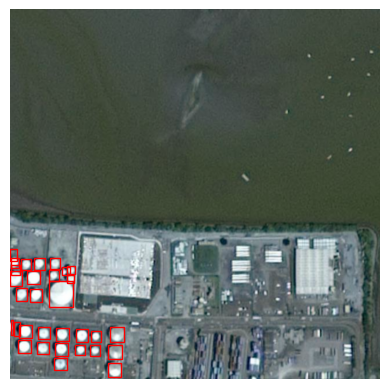

In [45]:
path = '/mnt/ddisk/boux/code/devit/demo/input/ea75050f-d6a4-4356-9314-0f17b05e972c_1216_576.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

2.0 2.9755085
2.0 2.9193811
2.0 2.8098657
2.0 2.7974668
2.0 2.7857077
2.0 2.470506
2.0 2.4495847
2.0 2.4305978
2.0 2.3574038
2.0 2.3503704
11.0 0.29677618


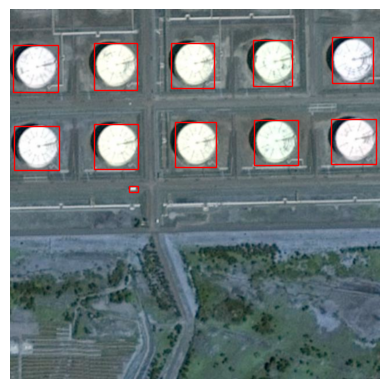

In [46]:
path = '/mnt/ddisk/boux/code/data/airbus_oil_tank_detection/test_split/test/4fe78c6c-8c59-4f98-9083-f8117dc19ae0_1920_1216.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

2.0 4.723739
2.0 4.6062574
2.0 4.56496
2.0 4.5579705
2.0 4.553716
2.0 4.5479264
2.0 4.5248375
2.0 4.3548646
2.0 4.145841
2.0 4.115608
2.0 4.1082506
2.0 4.0628276
2.0 4.0152116
2.0 3.8495235
2.0 3.8482718
2.0 3.8203802
2.0 3.810129
2.0 3.805499
2.0 3.7974997
2.0 3.7075648
2.0 3.6806788
2.0 3.6796787
2.0 3.5989184
2.0 3.5820146
2.0 3.5568202
2.0 3.5272014
2.0 3.5271504
2.0 3.395488
2.0 3.340453
2.0 3.3383753
2.0 3.3142705
2.0 3.3105552
2.0 3.3073924
2.0 3.3052459
2.0 3.2048628
2.0 3.2032495
2.0 3.1734555
2.0 3.1449676
2.0 3.102419
2.0 3.083507
2.0 2.9990747
2.0 2.9874327
2.0 2.9505537
2.0 2.9406114
2.0 2.936988
2.0 2.9181235
2.0 2.9069
2.0 2.8814871
2.0 2.8810563
2.0 2.8167129
2.0 2.7569344
6.0 2.7223058
2.0 2.5865257
2.0 2.5169697
2.0 2.46431
2.0 2.3510716
2.0 2.319608
2.0 2.2333798
2.0 2.1020854
2.0 2.0620737
2.0 2.0431828
2.0 1.9978824
2.0 1.9242913
2.0 1.8929762
2.0 1.8571757
2.0 1.805328
2.0 1.7207092
2.0 1.7087154
2.0 1.6325125
2.0 1.5143915
2.0 1.4616957
2.0 1.3668119
2.0 1.309516

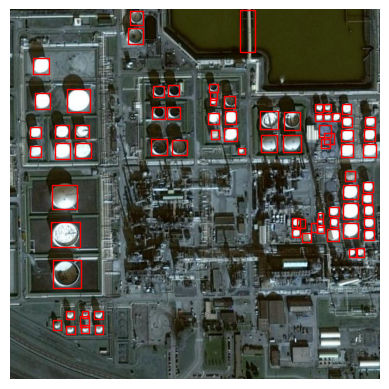

In [53]:
path = '/mnt/ddisk/boux/code/data/airbus_oil_tank_detection/test_split/test/400cbcc8-6b72-433b-ac46-92bef8ee6c66_576_1216.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

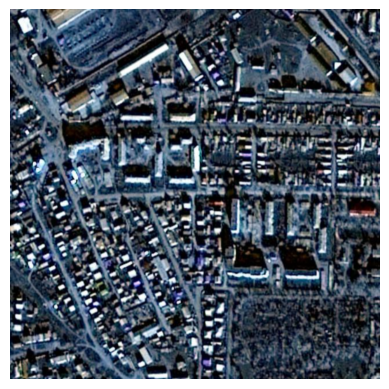

In [48]:
path = '/mnt/ddisk/boux/code/data/airbus_oil_tank_detection/test_split/test/cf65144d-ae6a-444f-9610-c8472d9b6016_1216_1856.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 3.9871414


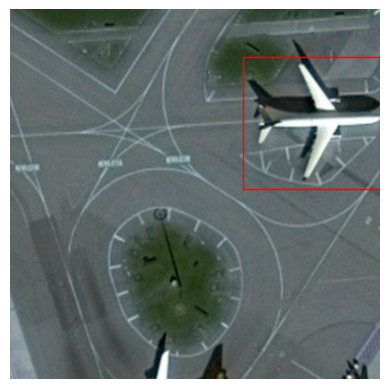

In [54]:
path = '/mnt/ddisk/boux/code/data/airbus_aircraft_detection/test_split/test/3da0b873-fdde-4faf-9a85-021248c7dacf.jpg_448_0.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 4.498715
0.0 4.457153
0.0 4.367682
0.0 4.350528
0.0 4.1806707
0.0 3.9690874
0.0 1.3886238


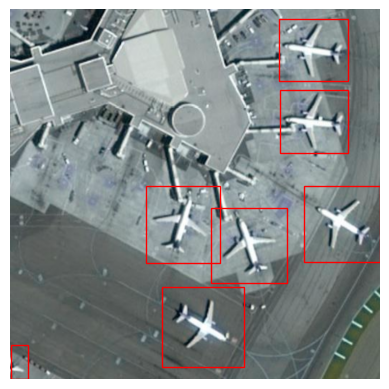

In [55]:
path = '/mnt/ddisk/boux/code/data/airbus_aircraft_detection/test_split/test/3e321b8a-9504-45aa-82b4-16158e28e290.jpg_1984_1472.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 4.6065083
0.0 4.363512
0.0 3.964386
0.0 3.9171238
0.0 3.7350538
0.0 2.0150852
0.0 1.6573225
0.0 1.2125169
0.0 0.9059444
0.0 0.7881513
0.0 0.74830914
0.0 0.70765525
0.0 0.46469337


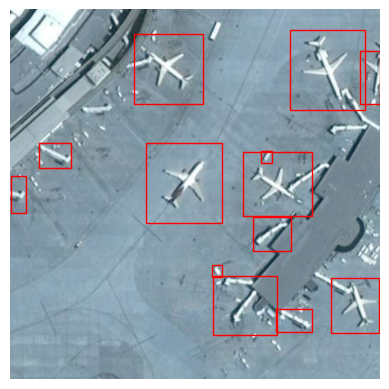

In [59]:
path = '/mnt/ddisk/boux/code/data/airbus_aircraft_detection/test_split/test/5f726a3d-9876-498f-90c5-9f9efae06c6a.jpg_2048_1984.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

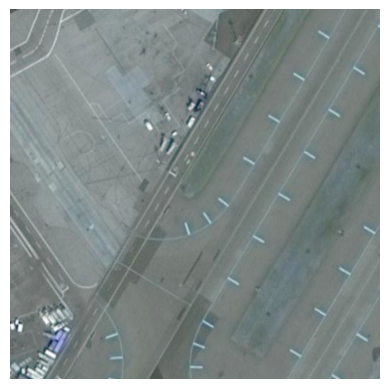

In [60]:
path = '/mnt/ddisk/boux/code/data/airbus_aircraft_detection/test_split/test/014de911-7810-4f7d-8967-3e5402209f4a.jpg_1984_1472.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 5.410533
0.0 5.1515493
0.0 4.3977737
0.0 3.740576


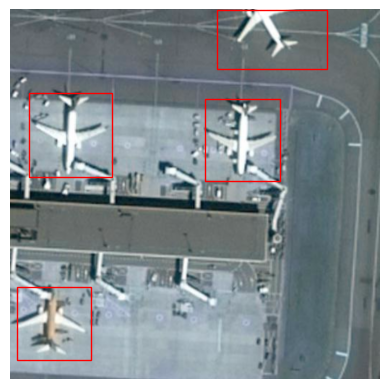

In [61]:
path = '/mnt/ddisk/boux/code/data/airbus_aircraft_detection/test_split/test/34ae857d-6e71-46b9-b694-d9e40fb093bc.jpg_1984_2048.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 3.644728


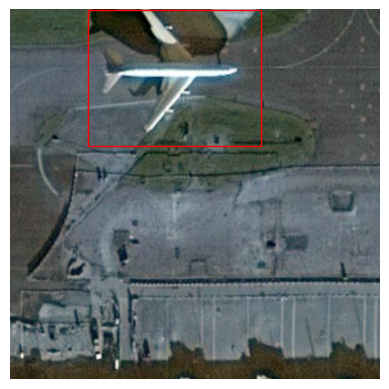

In [62]:
path = '/mnt/ddisk/boux/code/data/airbus_aircraft_detection/test_split/test/495b73c8-024f-46cc-b426-05e49bbe5074.jpg_2048_0.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

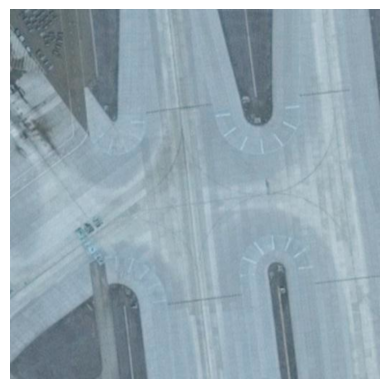

In [63]:
path = '/mnt/ddisk/boux/code/data/airbus_aircraft_detection/test_split/test/12210ad7-83f8-4b54-bb4b-e93f8ff6ac1f.jpg_1984_448.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 4.5769925
0.0 4.179269
11.0 2.9967844
0.0 2.9550214
2.0 1.9822782
2.0 1.690132
0.0 1.5143458
2.0 1.4809928
0.0 0.9013221
2.0 0.3132242


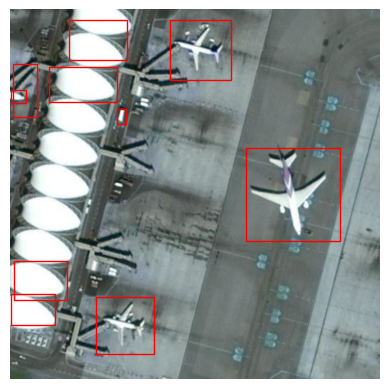

In [64]:
path = '/mnt/ddisk/boux/code/data/airbus_aircraft_detection/test_split/test/29324dbf-6043-4521-bd83-44a97ffc5281.jpg_2048_2048.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

13.0 4.9027963
13.0 4.885574
13.0 4.7467313
13.0 4.7374043
13.0 4.530164
13.0 4.461771
13.0 4.456328
13.0 4.4448967
13.0 4.4249287
13.0 4.3989706
13.0 4.32306
13.0 4.29099
13.0 4.2890487
13.0 4.2562127
13.0 4.114791
13.0 4.0341554
13.0 3.9421089
13.0 3.870121
13.0 3.841068
13.0 3.5312464
13.0 3.3229425
13.0 3.0707135
13.0 2.2049148
13.0 1.0536957
13.0 0.48961264
13.0 0.4685638


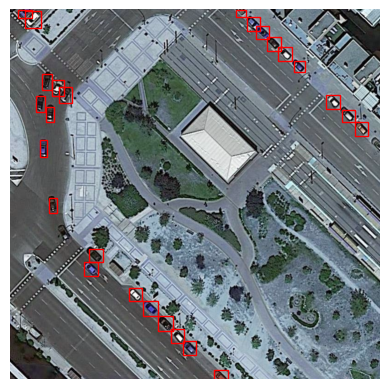

In [65]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P0087__1.0__1200___3600.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

13.0 4.7000594
13.0 4.6094537
13.0 4.334889
13.0 4.207069
13.0 4.0834618
13.0 4.0786366
13.0 4.0665164
13.0 4.01297
15.0 1.2069657


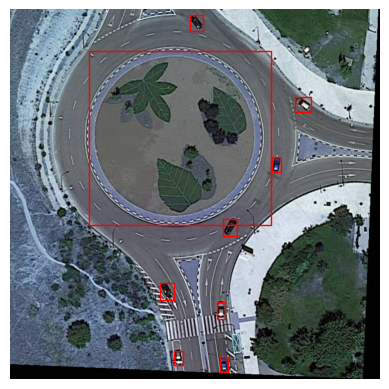

In [66]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P0100__1.0__149___135.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

13.0 5.175857
13.0 4.7630844
13.0 4.692613
13.0 4.635951
13.0 4.584239
13.0 4.24926
3.0 4.2241797
13.0 4.222385
13.0 4.1449914
3.0 4.018563
13.0 4.0053363
13.0 3.9233658
13.0 3.9214509
13.0 3.876828
13.0 3.8717272
13.0 3.8278072
13.0 3.6311889
3.0 3.5645907
3.0 3.3126209
13.0 2.8528383
13.0 2.8265676
1.0 1.7957319
1.0 1.2771294
4.0 0.85761255
13.0 0.37282032


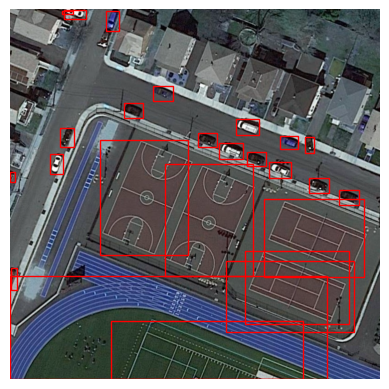

In [67]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P0373__1.0__77___88.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

9.0 4.2964067
13.0 4.2082562
13.0 4.1487446
13.0 4.1352963
13.0 3.7632809
13.0 2.9729586
13.0 1.8162472
13.0 1.3906279
11.0 0.871007
0.0 0.41685137
13.0 0.34217706


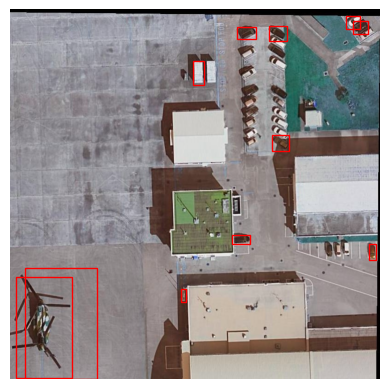

In [68]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P1486__1.0__696___0.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

11.0 4.967832
0.0 3.735048
11.0 3.7173717
13.0 3.1314313
11.0 3.1026156
11.0 2.8052156
11.0 2.7061598
11.0 2.6454802
13.0 2.4866962
11.0 2.3287735
11.0 1.7105815
11.0 1.2226094
0.0 1.1044513
11.0 1.0262859
11.0 0.92598206
11.0 0.7506952
11.0 0.6765908
11.0 0.6488211
11.0 0.54458106
11.0 0.37534812
11.0 0.31742257


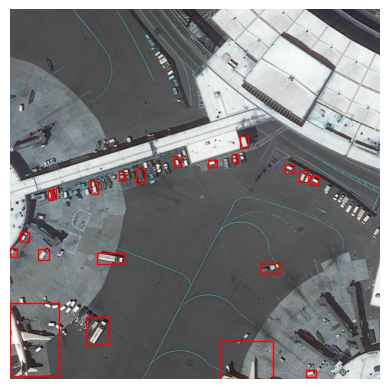

In [69]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P1414__1.0__1200___2400.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

7.0 5.0447097
7.0 4.709479
7.0 4.707839
13.0 4.547662
7.0 4.5394855
7.0 4.3842316
7.0 4.212827
7.0 4.153814
7.0 4.1460032
7.0 4.1104813
7.0 4.0615873
8.0 3.9851096
7.0 3.9841166
7.0 3.9826288
13.0 3.951309
7.0 3.9166348
7.0 3.905616
7.0 3.8399034
7.0 3.8132682
7.0 3.7951694
7.0 3.7908902
7.0 3.7168193
7.0 3.5444396
7.0 3.5244484
7.0 3.5237072
7.0 3.4227657
7.0 3.254103
7.0 2.6083434
8.0 2.521317
6.0 2.4331934
6.0 2.2042685
6.0 2.1588607
7.0 2.1069791
7.0 2.0646455
6.0 1.9309043
7.0 1.856535
7.0 1.6027334
7.0 1.4901735
13.0 1.4510438
7.0 1.2680484
6.0 1.263523
7.0 1.191781
6.0 1.165152
6.0 1.1593658
7.0 0.9677416
6.0 0.9446985
7.0 0.93033975
13.0 0.92837596
7.0 0.9021128
6.0 0.83920544
6.0 0.7353611
6.0 0.6894904
6.0 0.6887571
7.0 0.67610633
7.0 0.6665957
7.0 0.6410162
7.0 0.61758983
13.0 0.61749864
6.0 0.52855444
7.0 0.4438275
6.0 0.35293436


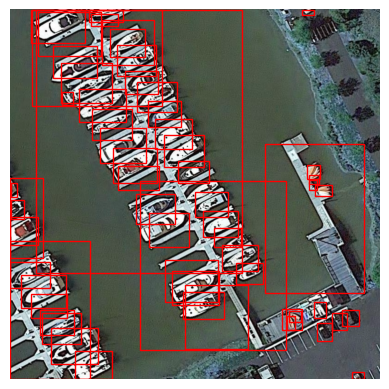

In [70]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P0874__1.0__662___1200.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

13.0 4.759696
10.0 4.7545414
13.0 4.705088
13.0 4.6730366
10.0 4.6021824
13.0 4.4983306
13.0 4.378467
10.0 4.138811
10.0 4.132403
13.0 4.0885925
13.0 4.0685515
10.0 3.996341
13.0 3.978049
13.0 3.9619594
13.0 3.8664968
13.0 3.8652081
10.0 3.8124938
13.0 3.672023
10.0 3.6604593
13.0 3.6426425
10.0 3.5849123
10.0 3.57203
10.0 3.5450046
10.0 3.5238166
10.0 3.435205
13.0 3.2528136
10.0 3.2325463
10.0 3.1165864
10.0 3.1057322
10.0 3.0624413
13.0 2.9954836
13.0 2.880673
10.0 2.7794247
13.0 2.2445474
13.0 2.0793672
13.0 1.9326817
13.0 1.8565307
13.0 1.6761403
13.0 1.4070112
13.0 1.3370111
13.0 0.9610731
13.0 0.71747994
10.0 0.42264363
13.0 0.38110566


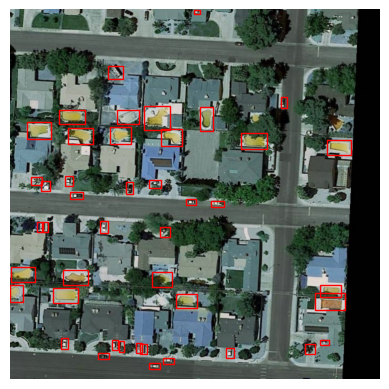

In [71]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/train_v1/images/P0064__1.0__2174___1200.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

7.0 5.2186356
7.0 4.8428674
7.0 4.515143
7.0 4.4146767
7.0 4.1930966
6.0 3.8427503
6.0 3.8150637
6.0 3.3903477
7.0 3.1258264
7.0 3.073218
7.0 3.0212638
8.0 2.7326467
8.0 2.5374146
7.0 1.9408324
8.0 1.8614602
8.0 1.8470497
7.0 1.817778
7.0 1.7446691
7.0 1.6143734
7.0 1.5797784
8.0 1.366957
7.0 1.3472914
7.0 1.3401718
8.0 1.2814243
6.0 1.2649037
7.0 1.249146
7.0 1.1582663
8.0 1.0463955
7.0 1.0174001
6.0 1.0071759
7.0 0.8663102
6.0 0.8398896
7.0 0.79626346
8.0 0.783203
8.0 0.7346194
7.0 0.650463
7.0 0.6300771
7.0 0.62844545
7.0 0.607154
7.0 0.56974244
8.0 0.5158843
7.0 0.5147871
6.0 0.5102074
7.0 0.42172948
6.0 0.36791196
8.0 0.35938647
8.0 0.3576541
7.0 0.31523007


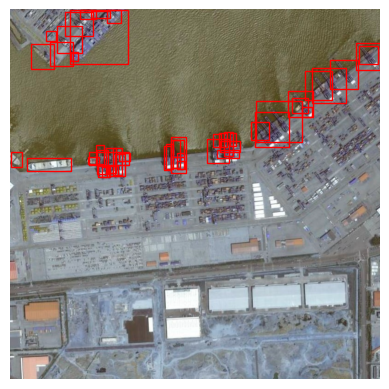

In [72]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P2732__1.0__600___1800.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

8.0 2.9097316
8.0 2.6740184
8.0 2.6391137
8.0 2.4756944
8.0 2.3171558
8.0 1.5255833
8.0 1.4458255
8.0 1.3352761
8.0 0.7271608
11.0 0.68947047


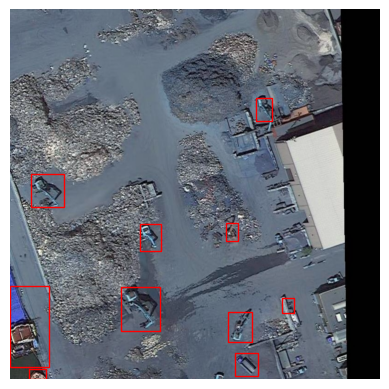

In [73]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P2642__1.0__6239___600.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

7.0 5.2464037
6.0 4.449222
7.0 4.027677
7.0 3.9818637
7.0 3.8998806
7.0 3.551156
7.0 3.1626563
7.0 3.0698338
7.0 2.862184
6.0 2.7944775
6.0 2.6994047
11.0 2.6947227
6.0 2.6812105
7.0 2.5251007
11.0 2.4083538
7.0 2.2665243
7.0 2.1847465
13.0 1.8756516
6.0 1.7954471
7.0 1.6883793
11.0 1.609193
7.0 1.5703512
11.0 1.4108747
11.0 1.3662267
6.0 1.3559542
6.0 1.3469856
7.0 1.2545047
7.0 1.1898044
11.0 1.1265754
6.0 1.0998511
11.0 1.0608809
7.0 0.91687983
7.0 0.9064695
12.0 0.9053327
6.0 0.88692087
7.0 0.85324985
7.0 0.80108255
11.0 0.79883033
11.0 0.79583126
11.0 0.77043396
7.0 0.65077245
6.0 0.5939816
7.0 0.57515967
7.0 0.46821177
6.0 0.45563498
7.0 0.41042534
7.0 0.3971607
6.0 0.3589333
11.0 0.35126886


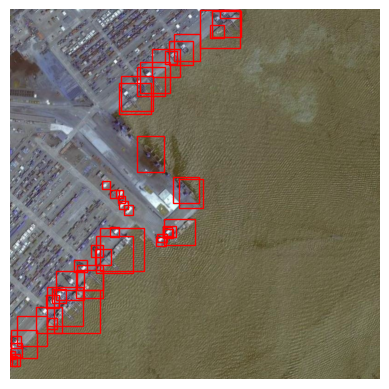

In [74]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P2732__1.0__1200___600.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

7.0 5.6409106
7.0 5.0876436
7.0 5.0003915
7.0 4.848919
7.0 4.54867
13.0 4.3514605
7.0 4.2787685
7.0 4.181605
7.0 3.9188523
6.0 3.5159733
6.0 3.0477111
6.0 2.8511372
7.0 2.5598917
7.0 2.3238533
6.0 2.2578874
6.0 2.2455082
6.0 1.5177906
7.0 1.1388409
10.0 0.9950296
7.0 0.8797242
6.0 0.6651416
7.0 0.44856453


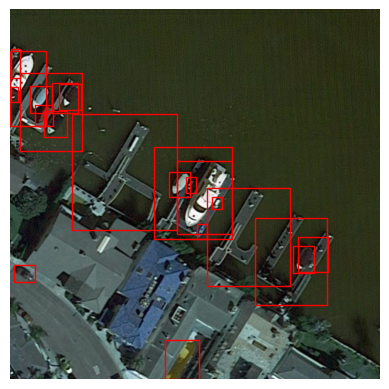

In [75]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P0724__1.0__858___298.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

7.0 4.7127895
7.0 4.683192
7.0 4.670338
7.0 4.6215363
7.0 4.554567
7.0 4.507759
7.0 4.503434
7.0 4.343621
7.0 4.325324
7.0 4.2671857
7.0 4.231263
7.0 4.1864614
7.0 4.1576605
13.0 4.0750294
13.0 4.030268
7.0 3.9756591
7.0 3.9225907
13.0 3.8422213
7.0 3.8380294
13.0 3.825052
7.0 3.8219807
7.0 3.811001
13.0 3.8053958
7.0 3.8043172
13.0 3.6901586
7.0 3.6402817
6.0 3.6253486
13.0 3.602046
7.0 3.59367
7.0 3.5167274
7.0 3.512619
7.0 3.4973905
6.0 3.4675982
13.0 3.4192092
7.0 3.3876665
13.0 3.3745465
13.0 3.3711824
6.0 3.2973192
7.0 3.284925
6.0 3.2531123
7.0 3.203807
6.0 3.1706097
6.0 3.1231992
6.0 3.0240955
7.0 3.005081
7.0 2.995969
7.0 2.9591765
13.0 2.902185
6.0 2.8998003
7.0 2.8966415
7.0 2.8277824
7.0 2.6671026
7.0 2.5798585
6.0 2.5633743
7.0 2.555254
6.0 2.53887
6.0 2.5382347
7.0 2.5310848
7.0 2.511836
7.0 2.3606746
7.0 2.352236
13.0 2.3068702
6.0 2.2954001
7.0 2.1755123
7.0 2.1501904
6.0 2.1459327
7.0 1.8592856
7.0 1.6299218
7.0 1.4344395
13.0 1.416052
7.0 1.4094121
6.0 1.3903518
13.0 

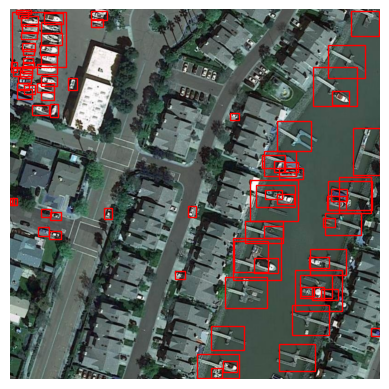

In [76]:
path = ''
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 5.1463733
0.0 4.7810993
0.0 4.780996
0.0 4.665821
0.0 4.6407814
0.0 4.485416
0.0 4.444242
0.0 4.387961
0.0 4.3714294
0.0 4.3186226
0.0 4.3043914
0.0 4.295618
0.0 4.256468
0.0 4.2134323
0.0 4.206857
0.0 4.18359
0.0 4.1762476
0.0 4.166355
0.0 4.1616783
0.0 4.154957
0.0 4.1459765
0.0 4.1167684
0.0 4.099439
0.0 4.0875535
0.0 4.086538
0.0 4.075019
0.0 4.062409
0.0 4.051306
0.0 4.0425773
0.0 4.0291176
0.0 4.0233912
0.0 4.016852
0.0 4.009137
0.0 3.9968386
0.0 3.9776113
0.0 3.969579
0.0 3.958757
0.0 3.9475691
0.0 3.9303658
0.0 3.9099917
0.0 3.9011922
0.0 3.892147
0.0 3.8742862
0.0 3.8570635
0.0 3.827036
0.0 3.8198786
0.0 3.791251
0.0 3.766885
0.0 3.7507434
0.0 3.7199025
0.0 3.6668835
0.0 3.64393
0.0 3.6406589
0.0 3.579897
0.0 3.5626528
0.0 3.5182688
0.0 3.516671
0.0 3.5110009
0.0 3.5040438
0.0 3.4690802
0.0 3.4672413
0.0 3.452028
0.0 3.4197304
0.0 3.4042501
0.0 3.397232
0.0 3.3498232
0.0 3.3386407
0.0 3.3293777
0.0 3.2921417
0.0 3.2302346
0.0 3.2202427
0.0 3.2195363
0.0 3.189346
0.0 3.1688

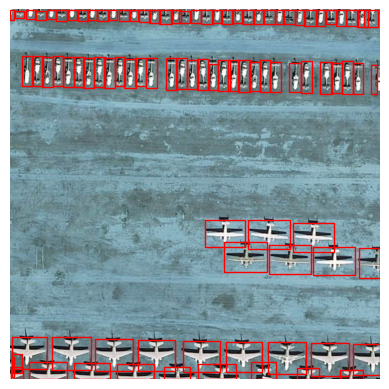

In [77]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P1392__1.0__1800___600.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

In [83]:
prototypes_path = '/mnt/ddisk/boux/code/dino_simple_detector/learned_embedding_lr2e-4_100epchs.pth'
# Use GPU if available
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
model = OVDDetector
prototypes = torch.load(prototypes_path)
bg_prototypes = torch.load(bg_prototypes_path)
model = OVDDetector(prototypes, bg_prototypes, scale_factor=scale_factor, target_size=target_size).to(device)

Using cache found in /home/boux/.cache/torch/hub/facebookresearch_dinov2_main


9.0 4.3540425
0.0 4.016645
9.0 3.9730732
0.0 3.935886
0.0 3.8909388
9.0 3.7842977
0.0 3.7534635
0.0 3.7254758
9.0 3.7215521
0.0 3.642484
0.0 3.6245174
9.0 3.614076
0.0 3.6140718
9.0 3.611943
9.0 3.6075447
0.0 3.5963259
9.0 3.53219
0.0 3.5279884
9.0 3.5267856
9.0 3.5195956
9.0 3.489441
9.0 3.4892251
9.0 3.4745355
9.0 3.4659545
0.0 3.44774
9.0 3.445594
0.0 3.4299397
0.0 3.4244888
0.0 3.4226081
0.0 3.4201262
9.0 3.412601
9.0 3.4080417
0.0 3.3991766
9.0 3.3820333
9.0 3.3787727
9.0 3.3691728
9.0 3.3648195
9.0 3.3547807
9.0 3.3486547
9.0 3.3301654
9.0 3.32309
9.0 3.3215258
9.0 3.2886996
9.0 3.231555
9.0 3.2275393
9.0 3.1902187
0.0 3.1634157
9.0 3.1591377
9.0 3.109478
0.0 3.0868685
9.0 3.078134
9.0 3.0684643
9.0 3.0571923
9.0 3.0231318
9.0 3.0109699
9.0 2.9702828
9.0 2.9579146
9.0 2.946965
9.0 2.9460762
9.0 2.9415116
9.0 2.9136078
0.0 2.9050148
9.0 2.9037464
9.0 2.8335254
0.0 2.7929504
9.0 2.7796412
0.0 2.6890323
9.0 2.6748445
9.0 2.6625142
0.0 2.6594174
0.0 2.6576233
9.0 2.6384494
0.0 2.5594

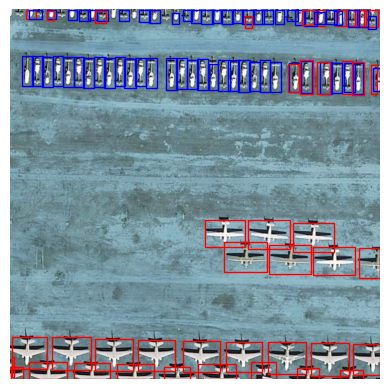

In [86]:
path = '/mnt/ddisk/boux/code/data/dota2.0/preprocessed/yolov5/test_v1/images/P1392__1.0__1800___600.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 4.5970044
0.0 4.5632024
0.0 4.451063
0.0 4.3341417
0.0 4.1109047
0.0 4.062249
0.0 4.0309415
2.0 3.739089
0.0 3.1336462
0.0 2.9704564
0.0 2.847189


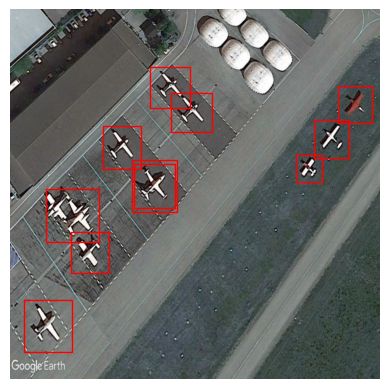

In [13]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0245.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

0.0 4.1379914
5.0 3.2401264
2.0 2.1350944
7.0 1.9170601


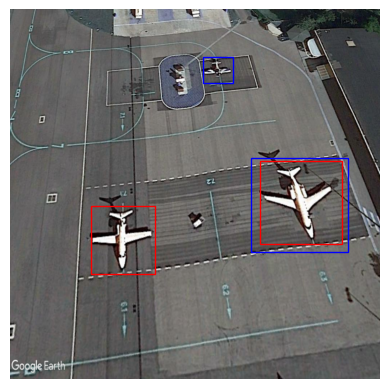

In [15]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0257.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

1.0 4.9343796
1.0 4.757852
1.0 3.326406
9.0 3.2029254
1.0 2.7731328
1.0 2.4906263
1.0 2.2258198
1.0 1.9864023
1.0 1.5662632
10.0 1.5366768
1.0 1.2620959
10.0 0.96780974
1.0 0.8598187
10.0 0.76551634
1.0 0.7206768
10.0 0.67974275
1.0 0.618267
1.0 0.48595807
10.0 0.4083156
10.0 0.40779275


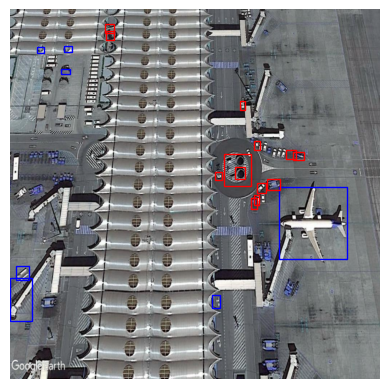

In [16]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0294.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

1.0 4.7759914
5.0 3.540068
5.0 3.311379
1.0 2.6219835
2.0 1.2418656
1.0 0.5654469


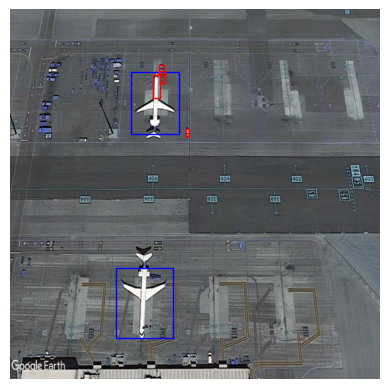

In [18]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0299.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

9.0 4.2452273
10.0 2.8239625
2.0 1.2184658
1.0 1.1522931
10.0 1.0143267


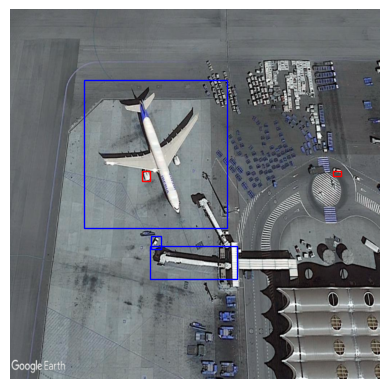

In [19]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0309.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

4.0 4.223253
4.0 4.1973386
11.0 4.115192
11.0 3.9402902
4.0 3.9399426
4.0 3.9192276
4.0 3.8934884
4.0 3.85197
4.0 3.8168416
3.0 3.7793567
4.0 3.6830862
4.0 3.6112282
8.0 3.4584248
11.0 3.2770822
8.0 3.257469
11.0 3.1462355
4.0 3.093655
4.0 2.704415
3.0 2.6704004
11.0 2.179894
4.0 2.1616166
1.0 1.4506451
3.0 1.2701097
1.0 1.0450798
3.0 1.0310905


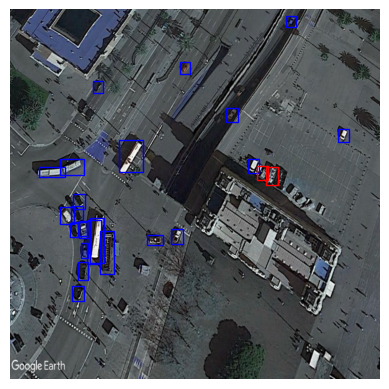

In [26]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0320.jpg'
preds, image = detect(path, model, iou_thr=0.2, conf_thres=1)
plot_image_with_boxes(image, preds)


4.0 6.581048
3.0 5.3881845
14.0 5.0758805
4.0 4.952909
3.0 4.922559
3.0 4.9028
4.0 4.8988423
3.0 4.6320934
4.0 4.5778975
3.0 4.573504
4.0 4.4867644
4.0 4.42804
4.0 3.9950383
11.0 3.9653418
4.0 3.8425457
4.0 3.7877254
11.0 3.7513201
11.0 3.70979
3.0 3.6386375
8.0 3.5824878
4.0 2.1314857
4.0 2.0850313
3.0 1.9819725
8.0 1.9014394
1.0 1.8663955
4.0 1.6193694
14.0 1.3774496
3.0 1.0824504


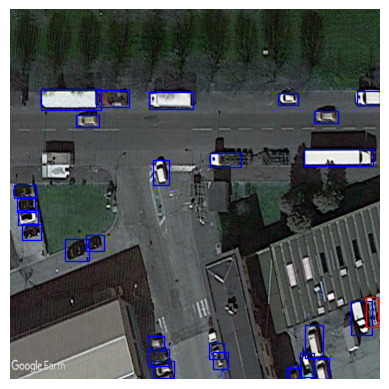

In [27]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0745.jpg'
preds, image = detect(path, model, conf_thres=1)
plot_image_with_boxes(image, preds)

14.0 5.4448633
3.0 4.9629602
8.0 4.6538944
14.0 4.293751
14.0 4.1783957
14.0 4.153934
14.0 4.1044974
8.0 3.9919133
3.0 3.342719
4.0 2.9186528
3.0 2.8954582
14.0 2.2885182
8.0 2.2387328
4.0 1.9462428
4.0 1.743322
11.0 1.4044557
1.0 1.324625
3.0 1.2217741
8.0 0.9433608
14.0 0.6376529


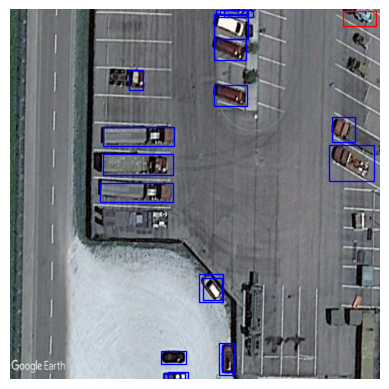

In [29]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0779.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

4.0 4.939461
4.0 4.46289
8.0 4.124769
4.0 3.6141572
4.0 3.3674452
4.0 2.9394262
8.0 2.905763
8.0 2.7872133
4.0 2.6555314
4.0 2.062225
12.0 1.6583744
4.0 1.5950985
8.0 0.7357751
4.0 0.7016421


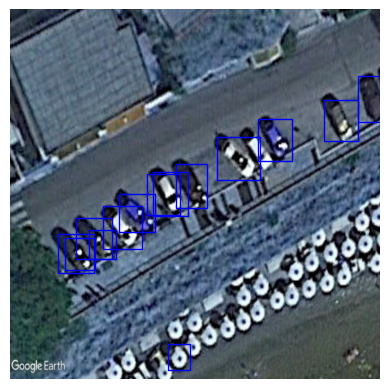

In [30]:
path = '/mnt/ddisk/boux/code/data/simd/validation/0994.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

5.0 3.0002322
5.0 1.742838


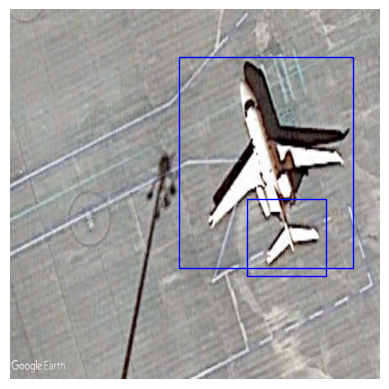

In [31]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1158.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

4.0 5.451803
8.0 5.4247117
4.0 4.4677906
8.0 4.210196
1.0 4.101913
4.0 3.7157512
4.0 3.382183
8.0 1.6305473
1.0 1.547856
8.0 0.9384402
4.0 0.77289146


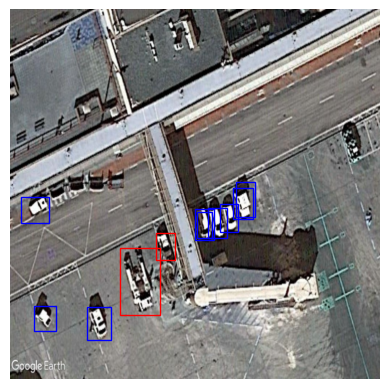

In [32]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1175.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

9.0 3.9598866


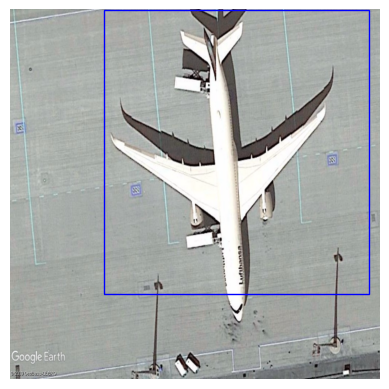

In [33]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1237.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

9.0 3.5842538


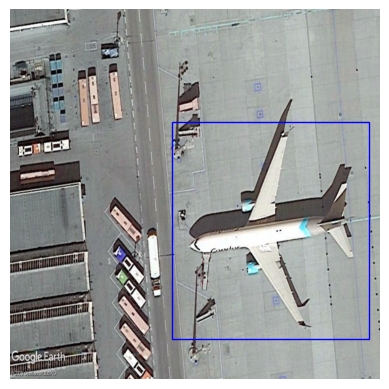

In [36]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1250.jpg'
preds, image = detect(path, model, conf_thres=0.5)
plot_image_with_boxes(image, preds)

11.0 3.9055889
11.0 3.648185
11.0 3.625004
11.0 3.6152003
11.0 3.5624406
3.0 3.3537302
1.0 3.1423194
11.0 2.8264666
1.0 0.3864719


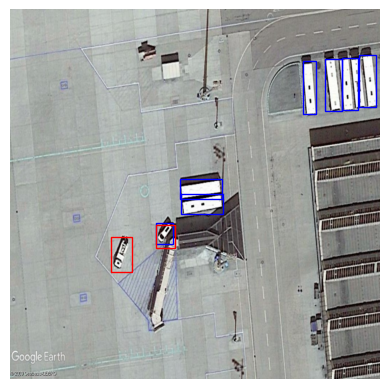

In [37]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1253.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

3.0 1.1599826
10.0 0.33388036


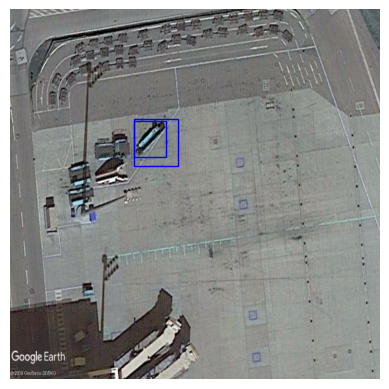

In [38]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1270.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

14.0 5.089899
14.0 4.978191
14.0 4.665951
14.0 4.6387696
14.0 4.5841875
14.0 4.542892
14.0 4.460229
14.0 4.453396
14.0 4.4131336
14.0 4.255229
14.0 4.0999885
14.0 4.0164614
8.0 3.9030406
14.0 3.790667
14.0 3.0704696
14.0 2.626713
14.0 1.8826376
14.0 1.1565663


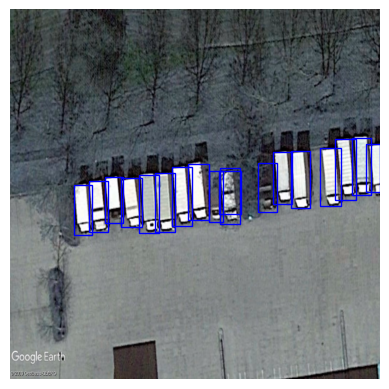

In [39]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1293.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

4.0 5.044707
4.0 4.3852744
4.0 4.2156906
4.0 3.7998815
4.0 3.5455046
3.0 2.9546394


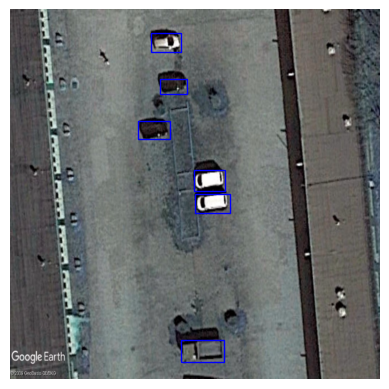

In [40]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1299.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

11.0 3.8135529
11.0 3.496444
3.0 3.2768674
11.0 1.2714388
11.0 0.7829165
11.0 0.6228475


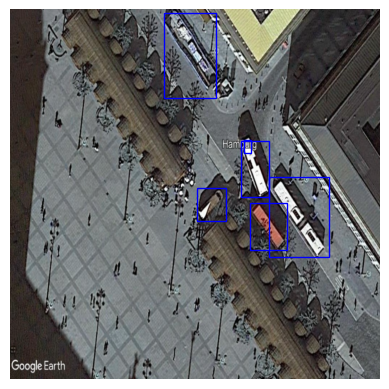

In [41]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1301.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

10.0 4.818706
1.0 4.4160376
8.0 2.6189008
10.0 1.0389882


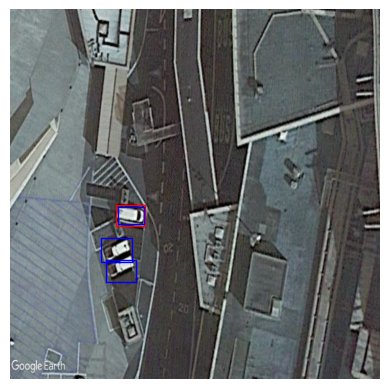

In [44]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1785.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

In [28]:
torch.load(prototypes_path)['label_names']

['trainer-aircraft',
 'pushback-truck',
 'propeller-aircraft',
 'truck',
 'car',
 'charted-aircraft',
 'figther-aircraft',
 'helicopter',
 'van',
 'airliner',
 'stair-truck',
 'bus',
 'boat',
 'others',
 'long-vehicle']

0.0 3.4001462
0.0 3.0416193
2.0 2.9904723


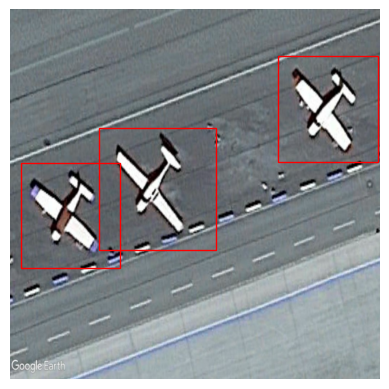

In [45]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1934.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

1.0 4.490096
1.0 4.2580853
1.0 4.1251698
10.0 3.2144873
1.0 3.174031
10.0 2.6723368
9.0 2.0525932
10.0 1.4057152
10.0 1.3147689
10.0 1.1482046
10.0 0.7358642
1.0 0.47936586
5.0 0.45976594
10.0 0.35494766


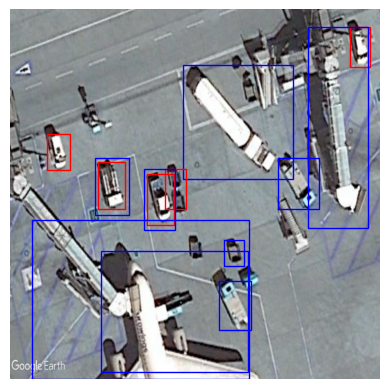

In [46]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1947.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

4.0 6.130961
4.0 5.420828
4.0 5.4188643
4.0 5.244326
4.0 4.519077
8.0 2.7888763
14.0 2.1896486
14.0 1.6091523
3.0 1.0237721
11.0 0.93727136
3.0 0.91136944
14.0 0.54710966
4.0 0.34149832


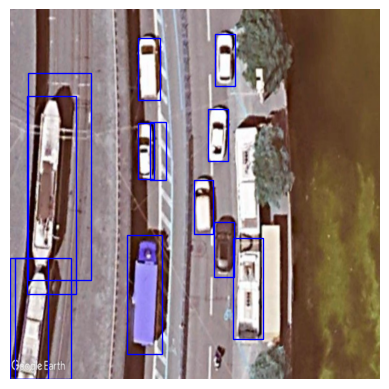

In [47]:
path = '/mnt/ddisk/boux/code/data/simd/validation/2002.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

14.0 3.0533278
11.0 2.4761384
14.0 1.7962847
8.0 1.481023
11.0 1.1401944
3.0 0.90266144


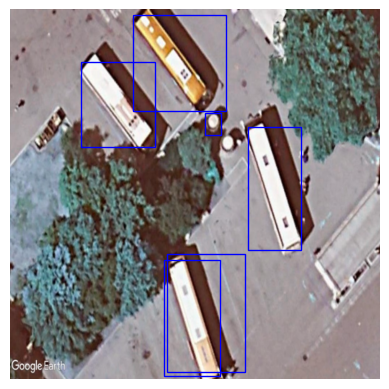

In [48]:
path = '/mnt/ddisk/boux/code/data/simd/validation/2018.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

In [ ]:
path = ''
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

In [ ]:
path = ''
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

In [ ]:
path = ''
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

In [ ]:
path = ''
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

In [ ]:
path = ''
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

12.0 3.4001758
11.0 3.2396595
12.0 3.1535723
12.0 2.8994749
12.0 2.7626998
11.0 2.6423757
12.0 2.5682306
12.0 2.1804688
12.0 0.3957369


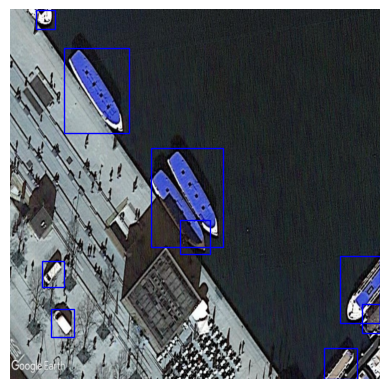

In [42]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1306.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)

10.0 4.818706
1.0 4.4160366
8.0 2.618901
10.0 1.0389882


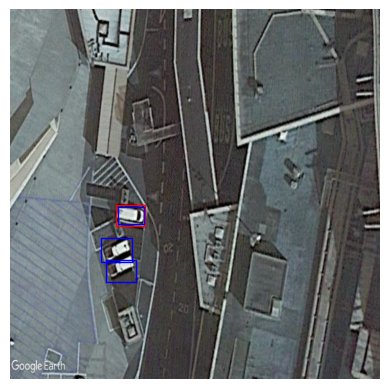

In [43]:
path = '/mnt/ddisk/boux/code/data/simd/validation/1785.jpg'
preds, image = detect(path, model)
plot_image_with_boxes(image, preds)